In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import argparse
import os
import itertools as it
import math

In [14]:
path1 = 'C:/Users/User/Desktop/barcode_proj/images/easier/mult2.jpg'

image_coloured = cv2.imread(path1)
image = cv2.cvtColor(image_coloured, cv2.COLOR_BGR2GRAY)


print (type(image))
print (image.shape)

<class 'numpy.ndarray'>
(1665, 2220)


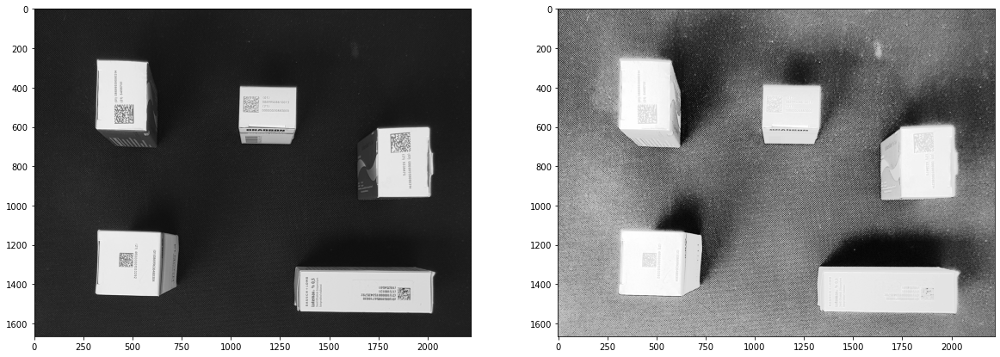

In [15]:
#enhancing contrast with histogram equalization
#will be useful for contour detection
high_contrast = cv2.equalizeHist(image)

# Plot

plt.figure(figsize=(20,10))

plt.subplot(1,2,1)
plt.imshow(image,'gray')

plt.subplot(1,2,2)
plt.imshow(high_contrast,'gray')

plt.show()





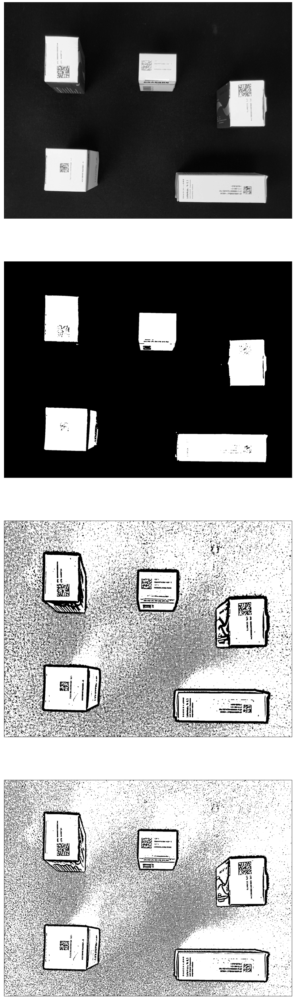

In [16]:
#median blur helps to eliminate salt&pepper noise - if it lowers DataMatrix decoding accuracy, it can be changed or eliminated.
blurred = cv2.medianBlur(image,7)
#trying different filter models
gaussian = cv2.adaptiveThreshold(blurred,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
            cv2.THRESH_BINARY,35,2)
ret,th1 = cv2.threshold(blurred,127,255,cv2.THRESH_BINARY)
adapt_mean = cv2.adaptiveThreshold(blurred,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,35,2)

images = [blurred, th1, adapt_mean, gaussian]
titles = ["Only Median Blurred","Binary Thresholded","Adaptive Thresholded - Mean","Adaptive Thresholded - Gaussian"]
plt.figure(figsize=(50,50))
for i in range(4):
    plt.subplot(4,1,i+1)
    plt.imshow(images[i],'gray')
    plt.xticks([]),plt.yticks([])
plt.show()

###  --> Adaptive Gaussian Thresholding may yield the best result for DataMatrix Extraction
Thresholding and denoising need more work, DataMatrix reading and contour detection may require different types of filtering.


Applying morphological closing: unclear if results are improved

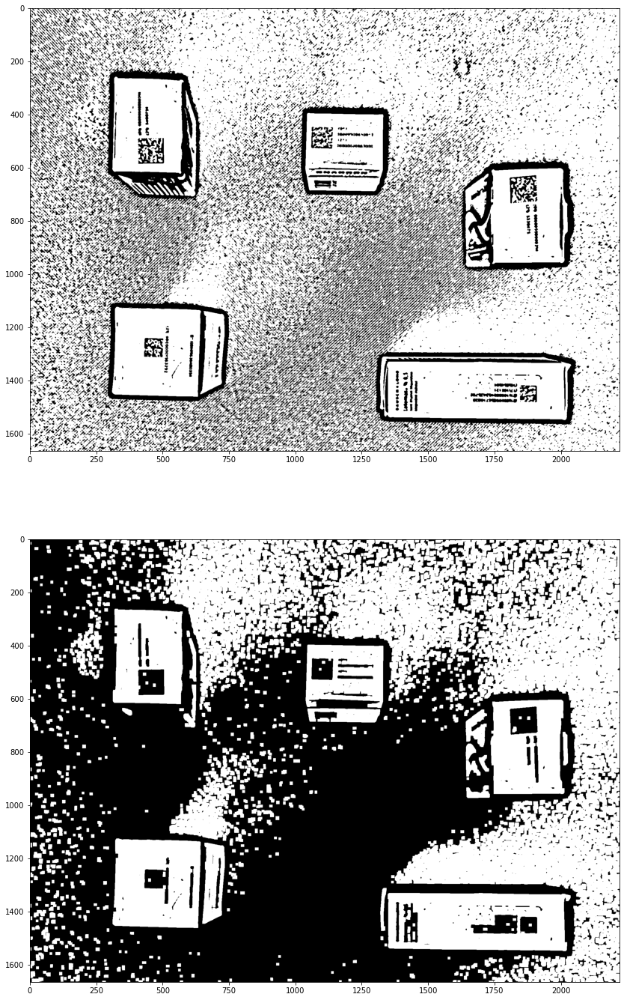

In [17]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(10,10))
opened = cv2.morphologyEx(adapt_mean, cv2.MORPH_OPEN, kernel)

plt.figure(figsize=(50,50))

plt.subplot(4,1,1)
plt.imshow(adapt_mean,'gray')

plt.subplot(4,1,2)
plt.imshow(opened,'gray')

plt.show()


## Contour Detection

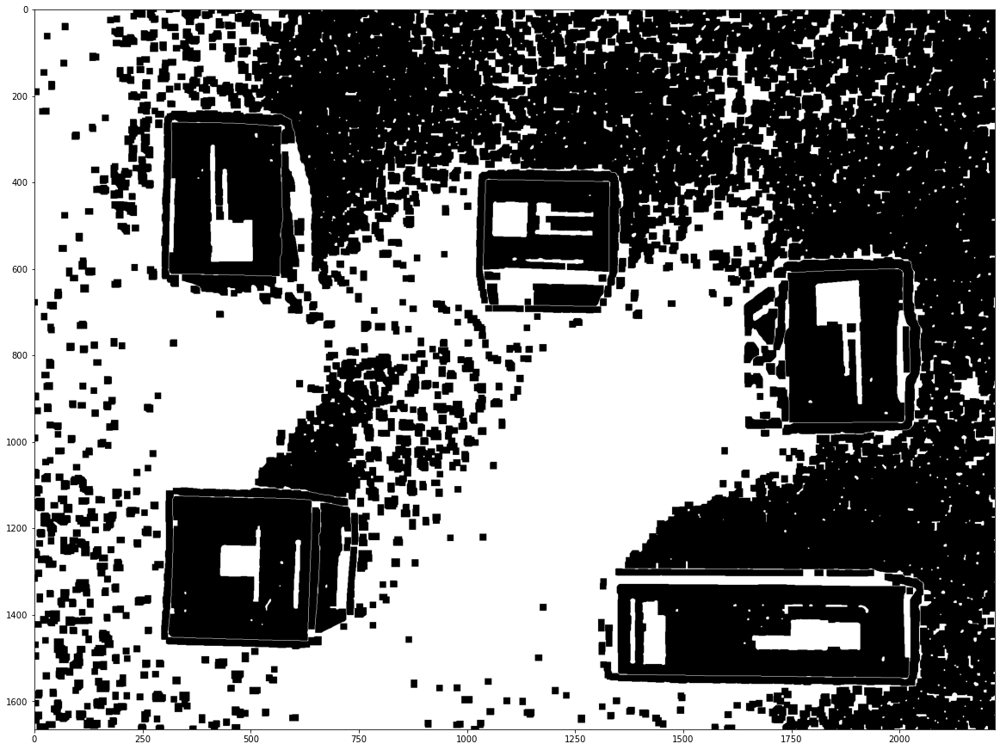

In [18]:

blurred_high_contrast = cv2.medianBlur(adapt_mean ,5) 


v = np.median(blurred_high_contrast)
sigma = 0.33

#---- Apply automatic Canny edge detection using the computed median----

lower = int(max(0, (1.0 - sigma) * v))
upper = int(min(255, (1.0 + sigma) * v))
edged = cv2.Canny(blurred_high_contrast, lower, upper)
#cv2.imshow('Edges',edged)


#edged = cv2.Canny(blurred_high_contrast, 5, 200)

kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 15))
closed = cv2.morphologyEx(edged, cv2.MORPH_CLOSE, kernel)

fig, ax = plt.subplots(1, 1, figsize=(20, 20))
ax.imshow(closed,cmap ='gray')

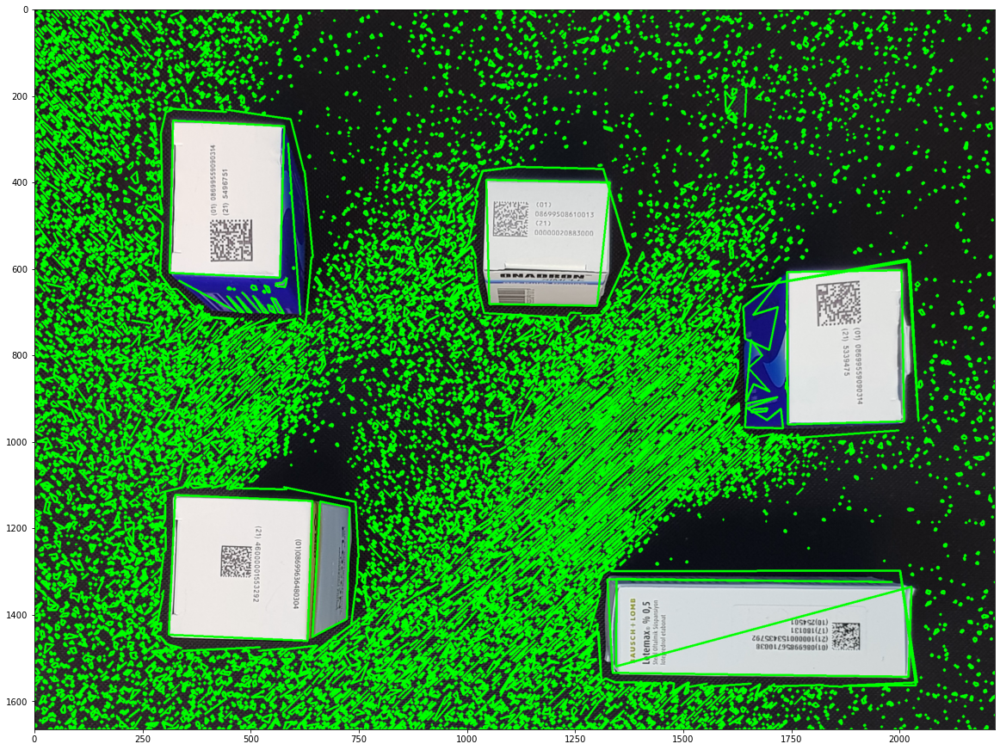

In [19]:
contours, hierarchy = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
approx_cnts = []
for cnt in contours:
    epsilon = 0.05*cv2.arcLength(cnt,True)
    approx = cv2.approxPolyDP(cnt,epsilon,True)
    #approx = cv2.convexHull(cnt)
    approx_cnts.append(approx)


new_img = image_coloured.copy()
contoured = cv2.drawContours(new_img, approx_cnts, -1, (0,255,0), 3)

fig, ax = plt.subplots(1, 1, figsize=(20, 20))
ax.imshow(contoured)

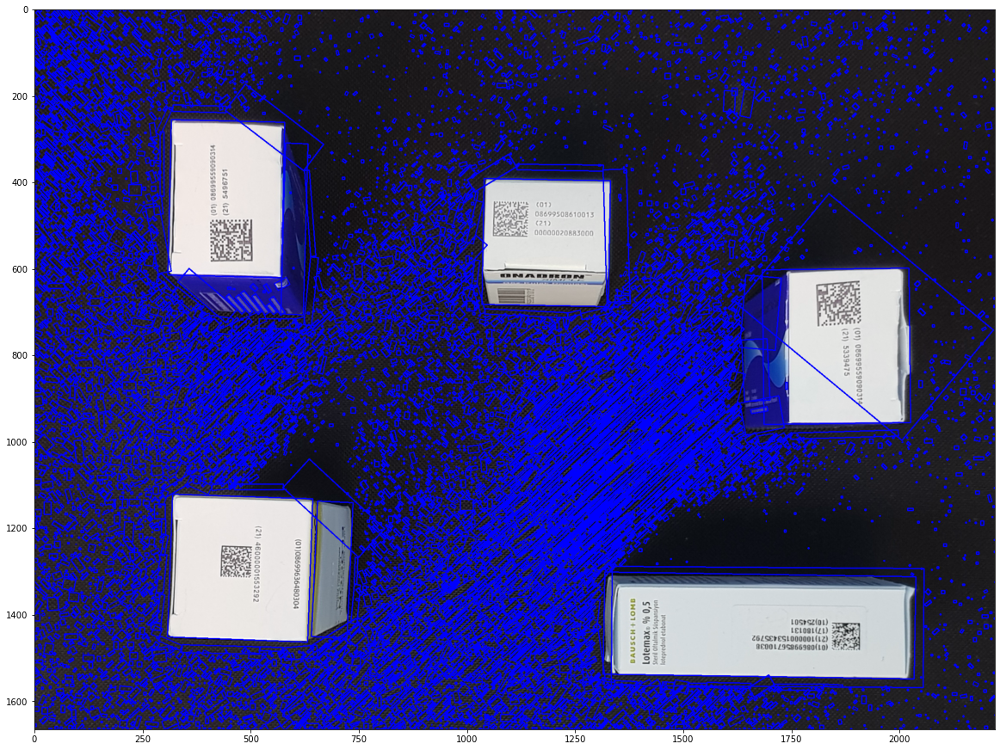

In [21]:
new_img = image_coloured.copy()
for cnt in contours:
    rect = cv2.minAreaRect(cnt)
    box = cv2.boxPoints(rect)
    box = np.int0(box)
    new_img = cv2.drawContours(new_img,[box],0,(0,0,255),2)
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
ax.imshow(new_img)

## Alternative with Hough Transform


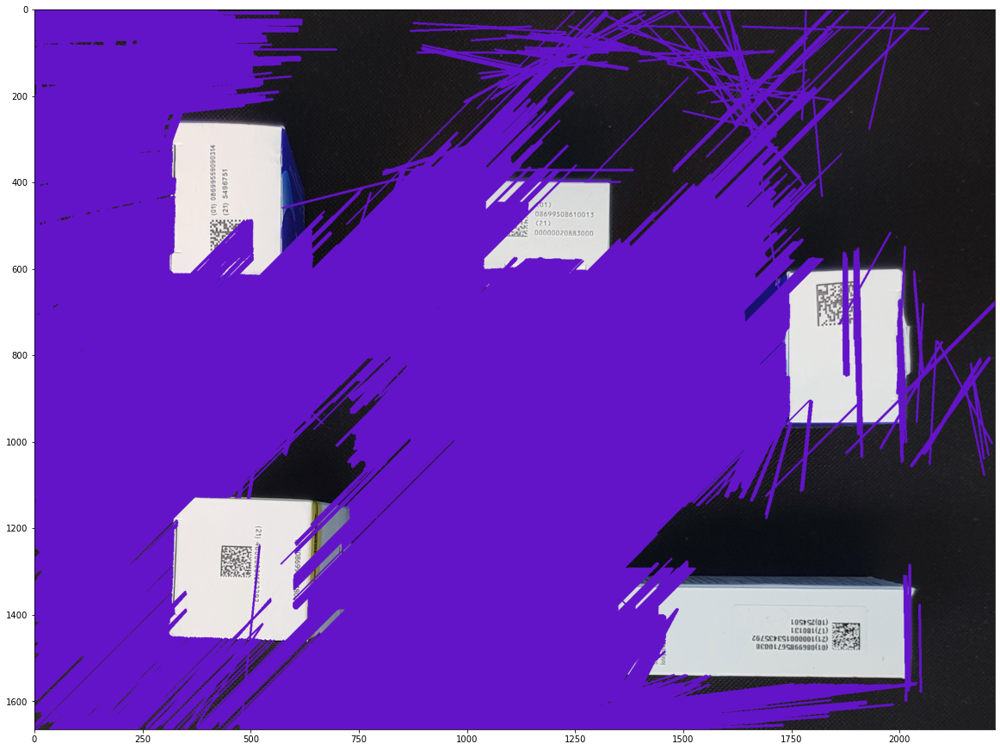

In [22]:
lines = cv2.HoughLinesP(closed, 1, np.pi/180, 100, np.array([]), 200, 50)
new_img2 = image_coloured.copy()
for line in lines:
    for x1, y1, x2, y2 in line:
        cv2.line(new_img2, (x1, y1), (x2, y2), (100, 20, 200), 3)
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

ax.imshow(new_img2)

True

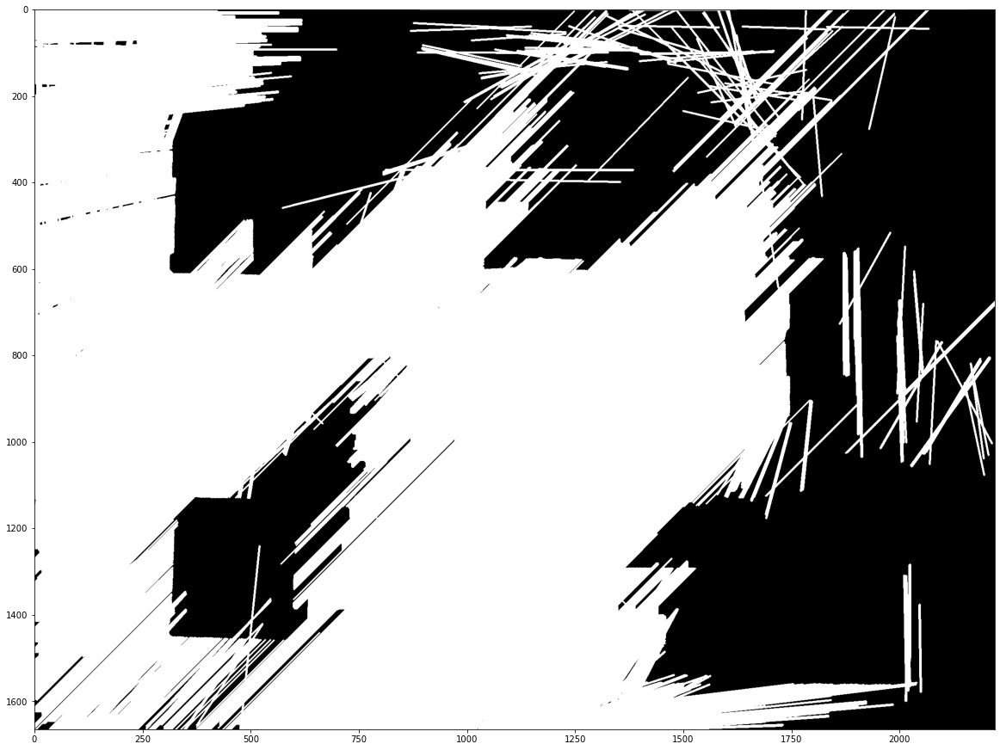

In [23]:
new_img3 = np.empty_like(image)
for line in lines:
    for x1, y1, x2, y2 in line:
        cv2.line(new_img3, (x1, y1), (x2, y2), (255), 3)
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
ax.imshow(new_img3,'gray')
cv2.imwrite('C:/Users/User/Desktop/barcode_proj/images/Hough_Lines.jpg',new_img3)

In [329]:
def pairDetection(lines,slopeMargin=0.01, distanceMargin = 0.1):
    pairs = []
    for linea, lineb in it.combinations( lines,2):
        x1a, y1a, x2a, y2a = linea[0]
        x1b, y1b, x2b, y2b = lineb[0]
        
        epsilon = 0.001
        #slopes
        slopea =  (y2a-y1a)/(x2a-x1a + epsilon)
        slopeb =  (y2b-y1b)/(x2b-x1b + epsilon)
        avgSlope = (slopea+slopeb)/2
        
        #lengths
        lena = math.sqrt((x2a - x1a)**2 + (y2a - y1a)**2) 
        lenb = math.sqrt((x2b - x1b)**2 + (y2b - y1b)**2) 
        avgLength = (lena+lenb)/2
        
        #distance between midpoints of lines
        distance = math.sqrt(( (x1a+x2a)/2 - (x1b+x2b)/2 )**2 + ( (y1a+y2a)/2 - (y1b+y2b)/2 )**2) 
        
        #length margin:
        lengthMargin = 
        
        
        #pair condition
        if abs(slopea-slopeb)< slopeMargin and abs(lena-lenb)< lengthMargin \
                                           and avgLength*distanceMargin < distance < avgLength/distanceMargin:
            
            #add new pair
            pairs.append([ linea[0], lineb[0], avgSlope, avgLength, distance ])
            #pair: [ line a , line b, average slope, average length, distance]
            
    return pairs
        
        
        

In [330]:
slopeMargin = 0.01
distanceMargin = 0.075
pairs = pairDetection(lines,slopeMargin=0.01, distanceMargin = 0.075)
print(len(pairs))

KeyboardInterrupt: 

In [ ]:
new_img3 = image_coloured.copy()
colour = (50, 20, 100)
for pair in pairs:
        colour += (10, 10, 0)
        cv2.line(new_img3, (pair[0][0], pair[0][1]), (pair[0][2], pair[0][3]), colour, 3)
        cv2.line(new_img3, (pair[1][0], pair[1][1]), (pair[1][2], pair[1][3]), colour, 3)
        
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
ax.imshow(new_img3)